In [1]:
import pandas as pd
import seaborn as sns
from results_analysis_functions import stack_its
from results_analysis_functions import load_and_filter
from results_analysis_functions import regression_analysis
from results_analysis_functions import LAInormal_timeseries
from results_analysis_functions import LAInormal_sp_timeseries
from results_analysis_functions import readfiles
from results_analysis_functions import filter_df
from results_analysis_functions import box_plots

# Results Analysis

#### Generate a dataframe of all model iterations

In [ ]:
file_path = 'C:\\Users\\ANGELASEIBERT\\Desktop\\Python_Workspace\\Results_Footprint_Fix\\func_test\\'
final_csv_name = 'finalcsv.csv'

In [ ]:
# stack_its(file_path, final_csv_name) # generates csv 

#### Load csv and filter 

In [29]:
results_path = 'C:\\Users\\ANGELASEIBERT\\Desktop\\Python_Workspace\\Results_Footprint_Fix\\LAI_all_FPFIXED.csv'

In [53]:
my_filtered_df = load_and_filter(results_path, 'species', 'all')

##### Palettes

In [ ]:
# access seaborn palette codes
pal = sns.color_palette("Greys")
print(pal)
sns.palplot(pal)

In [2]:
boxplot_CO2_palette = ['#ff7f00','#377eb8','#984ea3'] # color blind safe orange, blue, and purple
boxplot_control_palette = ['#984ea3'] # color blind safe purple
speciespalette = ['#f781bf', '#4daf4a'] # green and pink 
norm_line_palette = [(0.25059592464436753, 0.395847750865052, 0.6748942714340639),(0.5225682429834679, 0.7325643983083431, 0.8491349480968858), (0.9942329873125721, 0.7861591695501731, 0.47797001153402535),(0.9679354094579009, 0.5074202229911575, 0.2996539792387545),(0.7931564782775855, 0.14025374855824682, 0.15194156093810074),(0.6770011534025375, 0.6770011534025375, 0.6770011534025375)]
# grey is last

#### LAI Boxplots

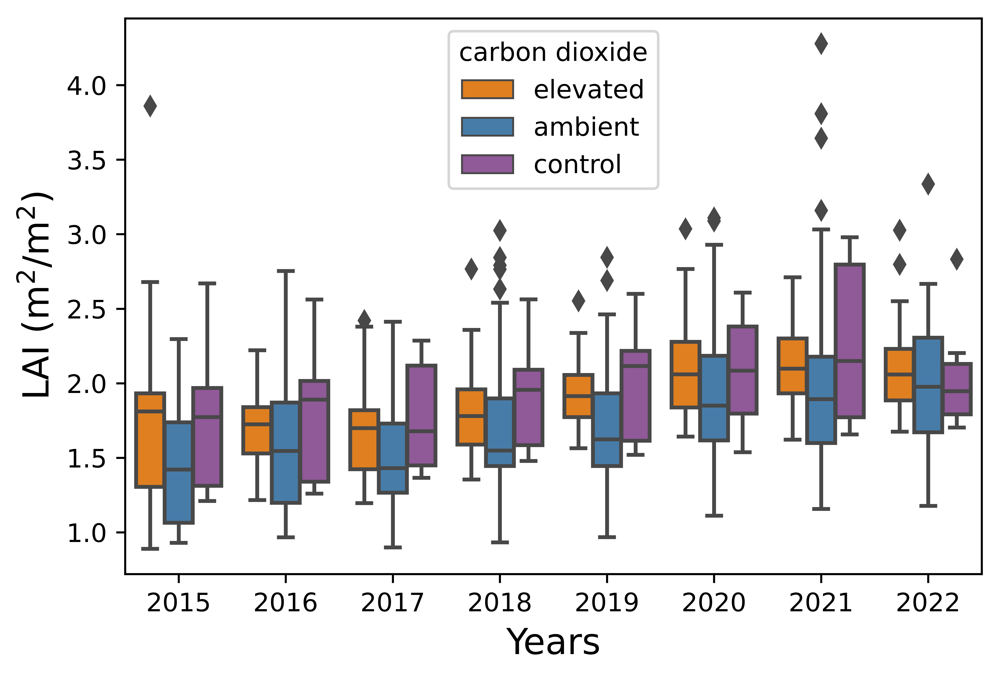

In [54]:
box_plots(my_filtered_df, boxplot_CO2_palette);

In [ ]:
from results_analysis_functions import filter_df

In [ ]:
filter_control_df = filter_df(my_filtered_df, 'temp', 'control')

In [ ]:
box_plots(filter_control_df, boxplot_control_palette);

#### LAI Kernel Density Distributions

In [ ]:
from results_analysis_functions import kde_plots

In [ ]:
kde_plots(my_filtered_df)

#### LAI Histogram

In [ ]:
from results_analysis_functions import LAI_hist_plot

In [ ]:
LAI_hist_plot(my_filtered_df);

#### Species LAI Time Series Figure

In [36]:
my_filtered_species_df = load_and_filter(results_path, 'species', 'all', exclude = True)

In [ ]:
filter_species_df = filter_df(my_filtered_species_df, 'temp', 'control', exclude = True)

In [ ]:
from results_analysis_functions import LAI_lineplot

In [ ]:
LAI_lineplot(filter_species_df, speciespalette);

#### Normalizing by temperature for mixed and species separated

In [31]:
from results_analysis_functions import normal_data

In [32]:
my_filtered_df # dataset only has mixed species

,plot,year,species,LAI,carbon dioxide,temp
0,plot10,2015,all,0.936575,elevated,9
1,plot10,2016,all,1.263778,elevated,9
2,plot10,2017,all,1.311808,elevated,9
3,plot10,2018,all,1.454139,elevated,9
4,plot10,2019,all,2.108386,elevated,9
...,...,...,...,...,...,...
2866,plot8,2018,all,1.687713,ambient,6.75
2869,plot8,2019,all,1.694628,ambient,6.75
2872,plot8,2020,all,2.040038,ambient,6.75
2875,plot8,2021,all,2.207699,ambient,6.75


#### Normalize Mixed eco2 Species by Temperature

In [2]:
filepath = 'C:\\Users\\ANGELASEIBERT\\Desktop\\Python_Workspace\\Results_Footprint_Fix\\func_test\\'

In [ ]:
what_temp = ['0', '2.25', '4.5', '6.75', '9']
csvname = ['eco2temp0.csv', 'eco2temp225.csv', 'eco2temp45.csv', 'eco2temp675.csv', 'eco2temp9.csv']

In [ ]:
for input1, input2 in zip (what_temp, csvname):
    normal_data(my_filtered_df, 'temp', input1, 'carbon dioxide', 'elevated', 'LAI', filepath, input2)

#### Normalize Mixed aco2 Species by Temperature

In [ ]:
what_temp = ['0', '2.25', '4.5', '6.75', '9']
csvname = ['aco2temp0.csv', 'aco2temp225.csv', 'aco2temp45.csv', 'aco2temp675.csv', 'aco2temp9.csv']

In [ ]:
for input1, input2 in zip (what_temp, csvname):
    normal_data(my_filtered_df, 'temp', input1, 'carbon dioxide', 'ambient', 'LAI', filepath, input2)

#### Normalize Mixed Species Control

In [ ]:
csvname = 'control.csv'

In [ ]:
normal_data(my_filtered_df, 'temp', 'control', 'carbon dioxide', 'control', 'LAI', filepath, csvname)

#### Normalize Spruce eco2, aco2, & control by temperature

In [37]:
spruce_df = filter_df(my_filtered_species_df, 'species', 'spruce', exclude = False) # filter the full species dataframe by individual species
# spruce_df

In [ ]:
what_temp = ['0', '2.25', '4.5', '6.75', '9']
csvname = ['spruce_eco2temp0.csv', 'spruce_eco2temp225.csv', 'spruce_eco2temp45.csv', 'spruce_eco2temp675.csv', 'spruce_eco2temp9.csv']
for input1, input2 in zip (what_temp, csvname):
    normal_data(spruce_df, 'temp', input1, 'carbon dioxide', 'elevated', 'LAI', filepath, input2)

In [ ]:
what_temp = ['0', '2.25', '4.5', '6.75', '9']
csvname = ['spruce_aco2temp0.csv', 'spruce_aco2temp225.csv', 'spruce_aco2temp45.csv', 'spruce_aco2temp675.csv', 'spruce_aco2temp9.csv']
for input1, input2 in zip (what_temp, csvname):
    normal_data(spruce_df, 'temp', input1, 'carbon dioxide', 'ambient', 'LAI', filepath, input2)

In [ ]:
csvname = 'spruce_control.csv'
normal_data(spruce_df, 'temp', 'control', 'carbon dioxide', 'control', 'LAI', filepath, csvname)

#### Normalize Larch eco2, aco2, & control by temperature

In [ ]:
larch_df = filter_df(my_filtered_species_df, 'species', 'larch', exclude = False) # filter the full species dataframe by individual species
# larch_df

In [ ]:
what_temp = ['0', '2.25', '4.5', '6.75', '9']
csvname = ['larch_eco2temp0.csv', 'larch_eco2temp225.csv', 'larch_eco2temp45.csv', 'larch_eco2temp675.csv', 'larch_eco2temp9.csv']
for input1, input2 in zip (what_temp, csvname):
    normal_data(larch_df, 'temp', input1, 'carbon dioxide', 'elevated', 'LAI', filepath, input2)

In [ ]:
what_temp = ['0', '2.25', '4.5', '6.75', '9']
csvname = ['larch_aco2temp0.csv', 'larch_aco2temp225.csv', 'larch_aco2temp45.csv', 'larch_aco2temp675.csv', 'larch_aco2temp9.csv']
for input1, input2 in zip (what_temp, csvname):
    normal_data(larch_df, 'temp', input1, 'carbon dioxide', 'ambient', 'LAI', filepath, input2)

In [ ]:
csvname = 'larch_control.csv'
normal_data(larch_df, 'temp', 'control', 'carbon dioxide', 'control', 'LAI', filepath, csvname)

#### plot mixed species LAI timeseries figures

In [ ]:
filepath_normaldfs = [filepath+'mixed_elevated\\', filepath+'mixed_ambient\\', filepath+'spruce_elevated\\', filepath+'spruce_ambient\\',
                     filepath+'larch_elevated\\', filepath+'larch_ambient\\']
final_csvnames = ['normmix_ele.csv', 'normmix_amb.csv', 'norm_spr_ele.csv', 'norm_spr_amb.csv', 'norm_lar_ele.csv', 
                  'norm_lar_amb.csv']

In [ ]:
for input1, input2 in zip (filepath_normaldfs, final_csvnames):
    stack_its(input1, input2)

#### mixed normalized LAI time series

In [38]:
normal_mix_el_df = pd.read_csv(filepath+'normmix_ele.csv')
normal_mix_am_df = pd.read_csv(filepath+'normmix_amb.csv')
norm_dfs_list = [normal_mix_el_df, normal_mix_am_df]
norm_legend_title_list = ['Temperature ($^\circ$C) eCO${}_2$','Temperature ($^\circ$C) aCO${}_2$'] 

In [55]:
# grouped by CO2 (boxplots visualize this)

datasets = [normal_mix_el_df, normal_mix_am_df]
year_vars = [normal_mix_el_df.year, normal_mix_am_df.year]
LAI_var = [normal_mix_el_df.LAI, normal_mix_am_df.LAI]

for var1, var2, var3 in zip(datasets, year_vars, LAI_var):
    regression_analysis(var1, var2, var3)

                            OLS Regression Results                            
Dep. Variable:                    LAI   R-squared:                       0.205
Model:                            OLS   Adj. R-squared:                  0.204
Method:                 Least Squares   F-statistic:                     144.2
Date:                Mon, 24 Jul 2023   Prob (F-statistic):           1.05e-29
Time:                        13:38:19   Log-Likelihood:                 86.049
No. Observations:                 560   AIC:                            -168.1
Df Residuals:                     558   BIC:                            -159.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -92.5606      7.739    -11.961      0.0

In [41]:
for item1, item2 in zip(norm_dfs_list, norm_legend_title_list):
    LAInormal_timeseries(item1, item2, norm_line_palette) 

#### Mixed species regression

##### eco2 mixed species regression

In [2]:
filepath = 'C:\\Users\\ANGELASEIBERT\\Desktop\\Python_Workspace\\Results_Footprint_Fix\\func_test\\'

In [3]:
filepath1 = filepath+'mixed_elevated\\'
filepath1

'C:\\Users\\ANGELASEIBERT\\Desktop\\Python_Workspace\\Results_Footprint_Fix\\func_test\\mixed_elevated\\'

In [8]:
dfs_normtemp_eco2 = readfiles(filepath1, 'eco2')

['control.csv', 'eco2temp0.csv', 'eco2temp225.csv', 'eco2temp45.csv', 'eco2temp675.csv', 'eco2temp9.csv', 'normmix_ele.csv']


In [24]:
# selecting the columns for the regression

mixed_ind_eco2 = []
mixed_dep_eco2 = []

for dfs in dfs_normtemp_eco2:
    mixed_ind_eco2.append(dfs['year'])
    mixed_dep_eco2.append(dfs['LAI'])

In [26]:
for data, ind_vars, dep_vars in zip(dfs_normtemp_eco2, mixed_ind_eco2, mixed_dep_eco2):
    regression_analysis(data, ind_vars, dep_vars)

                            OLS Regression Results                            
Dep. Variable:                    LAI   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.044
Date:                Mon, 24 Jul 2023   Prob (F-statistic):              0.310
Time:                        11:26:51   Log-Likelihood:                 3.7143
No. Observations:                  80   AIC:                            -3.429
Df Residuals:                      78   BIC:                             1.335
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -23.1293     23.041     -1.004      0.3

#### aco2 mixed regression

In [57]:
filepath2 = filepath+'mixed_ambient\\'
filepath2

dfs_normtemp_aco2 = readfiles(filepath2, 'aco2')

# selecting the columns for the regression

mixed_ind_aco2 = []
mixed_dep_aco2 = []

for dfs in dfs_normtemp_aco2:
    mixed_ind_aco2.append(dfs['year'])
    mixed_dep_aco2.append(dfs['LAI'])
    
for data, ind_vars, dep_vars in zip(dfs_normtemp_aco2, mixed_ind_aco2, mixed_dep_aco2):
    regression_analysis(data, ind_vars, dep_vars)

['aco2temp0.csv', 'aco2temp225.csv', 'aco2temp45.csv', 'aco2temp675.csv', 'aco2temp9.csv', 'control.csv', 'normmix_amb.csv']
                            OLS Regression Results                            
Dep. Variable:                    LAI   R-squared:                       0.630
Model:                            OLS   Adj. R-squared:                  0.625
Method:                 Least Squares   F-statistic:                     132.9
Date:                Mon, 24 Jul 2023   Prob (F-statistic):           1.61e-18
Time:                        14:02:14   Log-Likelihood:                 52.351
No. Observations:                  80   AIC:                            -100.7
Df Residuals:                      78   BIC:                            -95.94
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------

##### control mixed regression

In [48]:
dfs_normtemp_control = pd.read_csv(filepath+'mixed_elevated\\control.csv')

In [49]:
regression_analysis(dfs_normtemp_control, dfs_normtemp_control.year, dfs_normtemp_control.LAI)

                            OLS Regression Results                            
Dep. Variable:                    LAI   R-squared:                       0.140
Model:                            OLS   Adj. R-squared:                  0.135
Method:                 Least Squares   F-statistic:                     25.72
Date:                Mon, 24 Jul 2023   Prob (F-statistic):           1.09e-06
Time:                        12:03:51   Log-Likelihood:                 22.778
No. Observations:                 160   AIC:                            -41.56
Df Residuals:                     158   BIC:                            -35.41
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -74.1843     14.708     -5.044      0.0

#### spruce times series temp figures and analysis

In [3]:
filepath = 'C:\\Users\\ANGELASEIBERT\\Desktop\\Python_Workspace\\Results_Footprint_Fix\\func_test\\'

In [4]:
normal_mix_el_sprdf = pd.read_csv(filepath+'norm_spr_ele.csv')
normal_mix_am_sprdf = pd.read_csv(filepath+'norm_spr_amb.csv')

normspr_dfs_list = [normal_mix_el_sprdf, normal_mix_am_sprdf]
normspr_legend_title_list = ['Temperature ($^\circ$C) eCO${}_2$','Temperature ($^\circ$C) aCO${}_2$']
y_label = "Spruce Normalized Leaf Area Index (m${}^2$/m${}^2$)"
style_species = 'dashed'

In [5]:
for itemspr1, itemspr2 in zip(normspr_dfs_list, normspr_legend_title_list):
    LAInormal_sp_timeseries(itemspr1, itemspr2, y_label, norm_line_palette, style_species)

# INCOMPLETE 

In [ ]:
# SPRUCE ELEVATED AND AMBIENT BY TEMP REGRESSION ANALYSIS
-----

filepath3 = filepath+'spruce_elevated\\'
filepath3

dfs_normtemp_sp_eco2 = readfiles(filepath2, 'aco2')

# selecting the columns for the regression

mixed_ind_aco2 = []
mixed_dep_aco2 = []

for dfs in dfs_normtemp_aco2:
    mixed_ind_aco2.append(dfs['year'])
    mixed_dep_aco2.append(dfs['LAI'])
    
for data, ind_vars, dep_vars in zip(dfs_normtemp_aco2, mixed_ind_aco2, mixed_dep_aco2):
    regression_analysis(data, ind_vars, dep_vars)

In [ ]:
filepath4 = filepath+'spruce_ambient\\'
filepath4

dfs_normtemp_aco2 = readfiles(filepath2, 'aco2')

# selecting the columns for the regression

mixed_ind_aco2 = []
mixed_dep_aco2 = []

for dfs in dfs_normtemp_aco2:
    mixed_ind_aco2.append(dfs['year'])
    mixed_dep_aco2.append(dfs['LAI'])
    
for data, ind_vars, dep_vars in zip(dfs_normtemp_aco2, mixed_ind_aco2, mixed_dep_aco2):
    regression_analysis(data, ind_vars, dep_vars)